In [2]:
import pandas as pd
import numpy as np
import psycopg2 as psql
import matplotlib.pyplot as plt
plt.style.use('seaborn-colorblind')
conn = psql.connect(dbname='datawarehouse',
                       host='localhost', user='gabriel', password='gyfu')

In [3]:
fireCountDB = pd.DataFrame(data={'index': [], 'city': [], 'count': [] })
weatherDataDB = pd.DataFrame(data={'index': [], 'mimtemp': [], 'maxtemp': [], 'rainfall': [], 'windgustdir': [], 'windgustspeed': []})

In [4]:
for city in range(1, 31):
    cur = conn.cursor()
    cur.execute('select d.day, d.month, d.year, count(f.*) from date d left join fires f on d.id = f.dateid and f.locationid = {} group by d.day, d.month, d.year order by d.year, d.month, d.day asc;'.format(city))
    fireCount = cur.fetchall()
    cur.close()
    cur = conn.cursor()
    cur.execute('select d.day, d.month, d.year, w.mimtemp, w.maxtemp, w.rainfall, w.windgustdir, w.windgustspeed from date d left join weather w on d.id = w.dateid and w.locationid = {} order by d.year, d.month, d.day asc;'.format(city))
    weatherData = cur.fetchall()
    cur.close()


    index = []
    count = []
    location = []
    for day in fireCount:
        index.append((day[0], day[1], day[2], city))
        count.append(day[3])
        location.append(city)

    sup = pd.DataFrame(data={'index': index, 'city': location, 'count': count})
    fireCountDB = fireCountDB.append(sup, ignore_index=True)

    index = []
    mimtemp = []
    maxtemp = []
    rainfall = []
    windgustdir = []
    windgustspeed = []
    location = []
    for day in weatherData:
        index.append((day[0], day[1], day[2], city))
        mimtemp.append(day[3])
        maxtemp.append(day[4])
        rainfall.append(day[5])
        windgustdir.append(day[6])
        windgustspeed.append(day[7])

    sup = pd.DataFrame(data={'index': index, 'mimtemp': mimtemp, 'maxtemp': maxtemp, 'rainfall': rainfall, 'windgustdir': windgustdir, 'windgustspeed': windgustspeed})
    weatherDataDB = weatherDataDB.append(sup, ignore_index=True)
conn.close()

In [5]:
weatherDataDB = weatherDataDB.set_index('index')
weatherDataDB

,mimtemp,maxtemp,rainfall,windgustdir,windgustspeed
index,,,,,
"(1, 1, 2008, 1)",None,None,None,None,NaN
"(2, 1, 2008, 1)",None,None,None,None,NaN
"(3, 1, 2008, 1)",None,None,None,None,NaN
"(4, 1, 2008, 1)",None,None,None,None,NaN
"(5, 1, 2008, 1)",None,None,None,None,NaN
...,...,...,...,...,...
"(21, 6, 2017, 30)",None,None,None,None,NaN
"(22, 6, 2017, 30)",None,None,None,None,NaN
"(23, 6, 2017, 30)",None,None,None,None,NaN


In [6]:
fireCountDB = fireCountDB.set_index('index')
fireCountDB

,city,count
index,,
"(1, 1, 2008, 1)",1.0,0.0
"(2, 1, 2008, 1)",1.0,0.0
"(3, 1, 2008, 1)",1.0,0.0
"(4, 1, 2008, 1)",1.0,0.0
"(5, 1, 2008, 1)",1.0,0.0
...,...,...
"(21, 6, 2017, 30)",30.0,0.0
"(22, 6, 2017, 30)",30.0,0.0
"(23, 6, 2017, 30)",30.0,1.0


In [7]:
fireWeatherDataDB = weatherDataDB.merge(fireCountDB, left_index=True, right_index=True)
fireWeatherDataDB

,mimtemp,maxtemp,rainfall,windgustdir,windgustspeed,city,count
index,,,,,,,
"(1, 1, 2008, 1)",None,None,None,None,NaN,1.0,0.0
"(2, 1, 2008, 1)",None,None,None,None,NaN,1.0,0.0
"(3, 1, 2008, 1)",None,None,None,None,NaN,1.0,0.0
"(4, 1, 2008, 1)",None,None,None,None,NaN,1.0,0.0
"(5, 1, 2008, 1)",None,None,None,None,NaN,1.0,0.0
...,...,...,...,...,...,...,...
"(21, 6, 2017, 30)",None,None,None,None,NaN,30.0,0.0
"(22, 6, 2017, 30)",None,None,None,None,NaN,30.0,0.0
"(23, 6, 2017, 30)",None,None,None,None,NaN,30.0,1.0


In [8]:
fireWeatherDataDB = fireWeatherDataDB[fireWeatherDataDB.mimtemp.notnull()]
fireWeatherDataDB = fireWeatherDataDB[fireWeatherDataDB.maxtemp.notnull()]
fireWeatherDataDB = fireWeatherDataDB[fireWeatherDataDB.rainfall.notnull()]
fireWeatherDataDB = fireWeatherDataDB[fireWeatherDataDB.windgustdir.notnull()]
fireWeatherDataDB = fireWeatherDataDB[fireWeatherDataDB.windgustspeed.notnull()]
fireWeatherDataDB

,mimtemp,maxtemp,rainfall,windgustdir,windgustspeed,city,count
index,,,,,,,
"(7, 10, 2010, 1)",16.3,23.1,0.0,SSE,50.0,1.0,0.0
"(8, 10, 2010, 1)",13.8,19.5,0.0,ESE,35.0,1.0,0.0
"(9, 10, 2010, 1)",15.8,18.9,0.0,ESE,31.0,1.0,0.0
"(11, 10, 2010, 1)",16.5,21.1,1.2,ENE,56.0,1.0,0.0
"(12, 10, 2010, 1)",16.4,21.8,1.0,NNE,50.0,1.0,1.0
...,...,...,...,...,...,...,...
"(21, 6, 2017, 29)",8.9,13.1,0.8,SSE,26.0,29.0,1.0
"(22, 6, 2017, 29)",7.5,15.1,0.0,NW,26.0,29.0,0.0
"(23, 6, 2017, 29)",5.6,14.2,0.0,NNW,26.0,29.0,0.0


In [9]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
fireWeatherDataDB['windgustdir'] = enc.fit_transform(fireWeatherDataDB['windgustdir'])
fireWeatherDataDB

,mimtemp,maxtemp,rainfall,windgustdir,windgustspeed,city,count
index,,,,,,,
"(7, 10, 2010, 1)",16.3,23.1,0.0,10,50.0,1.0,0.0
"(8, 10, 2010, 1)",13.8,19.5,0.0,2,35.0,1.0,0.0
"(9, 10, 2010, 1)",15.8,18.9,0.0,2,31.0,1.0,0.0
"(11, 10, 2010, 1)",16.5,21.1,1.2,1,56.0,1.0,0.0
"(12, 10, 2010, 1)",16.4,21.8,1.0,5,50.0,1.0,1.0
...,...,...,...,...,...,...,...
"(21, 6, 2017, 29)",8.9,13.1,0.8,10,26.0,29.0,1.0
"(22, 6, 2017, 29)",7.5,15.1,0.0,7,26.0,29.0,0.0
"(23, 6, 2017, 29)",5.6,14.2,0.0,6,26.0,29.0,0.0


In [10]:
from sklearn.preprocessing import StandardScaler
for colum in fireWeatherDataDB.columns.values:
    scaler = StandardScaler()
    scaler_data = fireWeatherDataDB[colum].values.copy()
    scaler_data.shape = (len(scaler_data), 1)
    fireWeatherDataDB[colum] = scaler.fit_transform(scaler_data)
fireWeatherDataDB

,mimtemp,maxtemp,rainfall,windgustdir,windgustspeed,city,count
index,,,,,,,
"(7, 10, 2010, 1)",0.821600,0.162876,-0.293159,0.445724,0.726605,-1.717949,-0.262718
"(8, 10, 2010, 1)",0.405428,-0.363212,-0.293159,-1.300068,-0.315323,-1.717949,-0.262718
"(9, 10, 2010, 1)",0.738366,-0.450893,-0.293159,-1.300068,-0.593171,-1.717949,-0.262718
"(11, 10, 2010, 1)",0.854894,-0.129395,-0.145687,-1.518293,1.143377,-1.717949,-0.262718
"(12, 10, 2010, 1)",0.838247,-0.027100,-0.170265,-0.645396,0.726605,-1.717949,-0.140730
...,...,...,...,...,...,...,...
"(21, 6, 2017, 29)",-0.410269,-1.298478,-0.194844,0.445724,-0.940481,1.686677,-0.140730
"(22, 6, 2017, 29)",-0.643326,-1.006207,-0.293159,-0.208948,-0.940481,1.686677,-0.262718
"(23, 6, 2017, 29)",-0.959616,-1.137729,-0.293159,-0.427172,-0.940481,1.686677,-0.262718


In [11]:
target = fireWeatherDataDB.values[:, -1]
x = fireWeatherDataDB.values[:, :-1]
print(x)
print(target)

[[ 0.8216004   0.16287563 -0.29315885  0.44572398  0.72660549 -1.71794924]
 [ 0.40542826 -0.36321156 -0.29315885 -1.30006846 -0.31532341 -1.71794924]
 [ 0.73836597 -0.45089276 -0.29315885 -1.30006846 -0.59317112 -1.71794924]
 ...
 [-0.95961634 -1.13772881 -0.29315885 -0.42717224 -0.94048075  1.68667745]
 [-0.85973503 -1.4884536   0.07552139  1.10039614 -1.35725231  1.68667745]
 [-0.90967569 -1.25463708 -0.26858017 -0.20894819 -0.59317112  1.68667745]]
[-0.26271835 -0.26271835 -0.26271835 ... -0.26271835 -0.26271835
 -0.26271835]


In [12]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import cross_val_predict
from sklearn import metrics

mlpr = MLPRegressor(hidden_layer_sizes=(50,100,200,400,200,100,), activation='relu', max_iter=1000)
fullPredictMLPR = cross_val_predict(mlpr, x, target, cv=10)

print('Mean Squared Error: %s' %(metrics.mean_squared_error(target, fullPredictMLPR)))
print('R2: %s' %(metrics.r2_score(target, fullPredictMLPR)))

fireWeatherDataDB['predictMLPR'] = fullPredictMLPR

Mean Squared Error: 1.0191314698722955
R2: -0.019131469872295304


In [13]:
from sklearn.linear_model import LinearRegression

lR = LinearRegression()
fullPredictLR = cross_val_predict(lR, x, target, cv=10)
print('Mean Squared Error: %s' %(metrics.mean_squared_error(target, fullPredictLR)))
print('R2: %s' %(metrics.r2_score(target, fullPredictLR)))

fireWeatherDataDB['predictLR'] = fullPredictLR

Mean Squared Error: 0.9820891773312181
R2: 0.017910822668782078


In [14]:
from sklearn.linear_model import SGDRegressor

sgd = SGDRegressor(loss='squared_epsilon_insensitive', penalty='elasticnet', learning_rate='adaptive')
fullPredictSGD = cross_val_predict(sgd, x, target, cv=10)
print('Mean Squared Error: %s' %(metrics.mean_squared_error(target, fullPredictSGD)))
print('R2: %s' %(metrics.r2_score(target, fullPredictSGD)))

fireWeatherDataDB['predictSGD'] = fullPredictSGD

Mean Squared Error: 0.9858664714485003
R2: 0.014133528551499963


In [15]:
from sklearn.linear_model import ElasticNet

eN = ElasticNet()
fullPredictEN = cross_val_predict(eN, x, target, cv=10)
print('Mean Squared Error: %s' %(metrics.mean_squared_error(target, fullPredictEN)))
print('R2: %s' %(metrics.r2_score(target, fullPredictEN)))

fireWeatherDataDB['predictEN'] = fullPredictEN

Mean Squared Error: 1.0018594376080956
R2: -0.0018594376080953712


In [16]:
from sklearn.linear_model import BayesianRidge

bR = BayesianRidge()
fullPredictBR = cross_val_predict(bR, x, target, cv=10)
print('Mean Squared Error: %s' %(metrics.mean_squared_error(target, fullPredictBR)))
print('R2: %s' %(metrics.r2_score(target, fullPredictBR)))

fireWeatherDataDB['predictBR'] = fullPredictBR

Mean Squared Error: 0.9820912024220959
R2: 0.0179087975779042


In [17]:
from sklearn.ensemble import GradientBoostingRegressor

gBR = GradientBoostingRegressor()
fullPredictGBR = cross_val_predict(gBR, x, target, cv=10)
print('Mean Squared Error: %s' %(metrics.mean_squared_error(target, fullPredictGBR)))
print('R2: %s' %(metrics.r2_score(target, fullPredictGBR)))

fireWeatherDataDB['predictGBR'] = fullPredictGBR

Mean Squared Error: 1.1593347718830278
R2: -0.15933477188302758


In [18]:
from sklearn.svm import SVR

sVR = SVR()
fullPredictSVR = cross_val_predict(sVR, x, target, cv=10)
print('Mean Squared Error: %s' %(metrics.mean_squared_error(target, fullPredictSVR)))
print('R2: %s' %(metrics.r2_score(target, fullPredictSVR)))

fireWeatherDataDB['predictSVR'] = fullPredictSVR

Mean Squared Error: 1.0162159322087068
R2: -0.016215932208706763


<AxesSubplot:xlabel='index'>

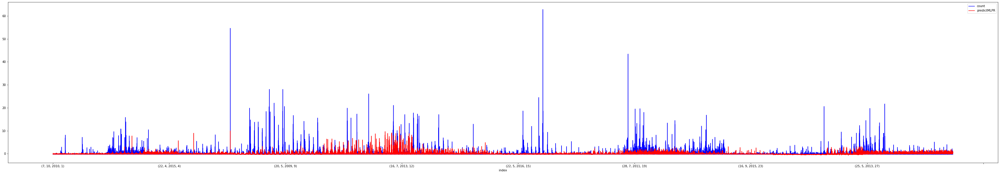

In [20]:
fireWeatherDataDB.plot(y=['count', 'predictMLPR'], figsize=(60,10), color=['blue', 'red'])

<AxesSubplot:xlabel='index'>

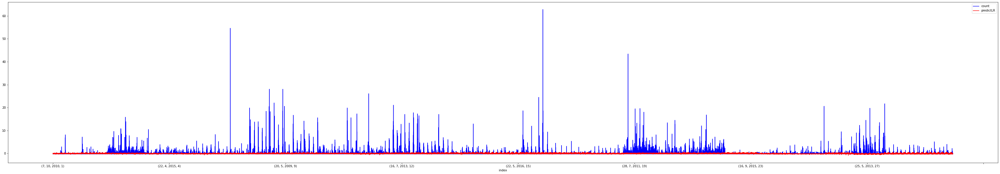

In [21]:
fireWeatherDataDB.plot(y=['count', 'predictLR'], figsize=(60,10), color=['blue', 'red'])

<AxesSubplot:xlabel='index'>

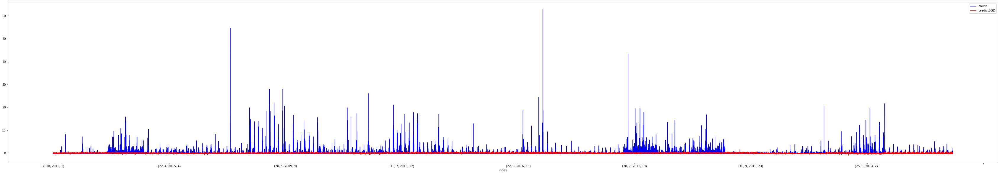

In [22]:
fireWeatherDataDB.plot(y=['count', 'predictSGD'], figsize=(60,10), color=['blue', 'red'])

<AxesSubplot:xlabel='index'>

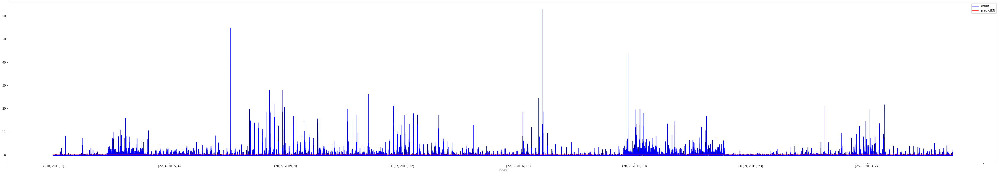

In [23]:
fireWeatherDataDB.plot(y=['count', 'predictEN'], figsize=(60,10), color=['blue', 'red'])

<AxesSubplot:xlabel='index'>

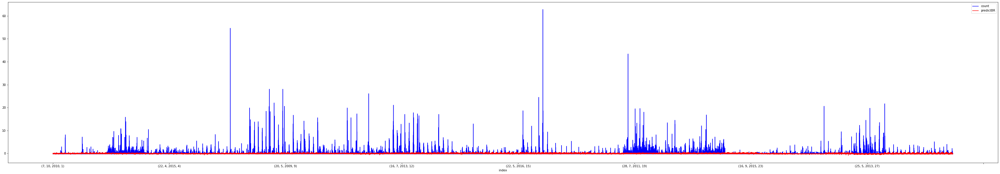

In [24]:
fireWeatherDataDB.plot(y=['count', 'predictBR'], figsize=(60,10), color=['blue', 'red'])

<AxesSubplot:xlabel='index'>

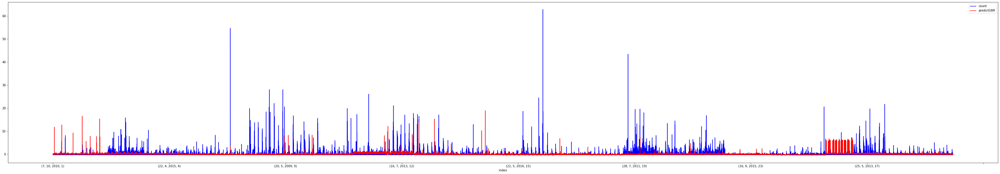

In [25]:
fireWeatherDataDB.plot(y=['count', 'predictGBR'], figsize=(60,10), color=['blue', 'red'])

<AxesSubplot:xlabel='index'>

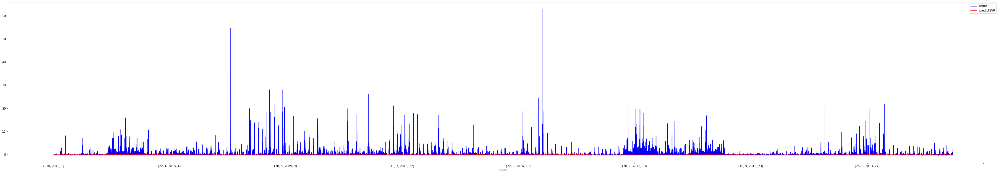

In [26]:
fireWeatherDataDB.plot(y=['count', 'predictSVR'], figsize=(60,10), color=['blue', 'red'])